# Music Genre Classification

In [261]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')
import os

import os
for dirname, _, filenames in os.walk('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\features_30_sec.csv
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\features_3_sec.csv
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\genres_original\blues\blues.00000.wav
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\genres_original\blues\blues.00001.wav
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\genres_original\blues\blues.00002.wav
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\genres_original\blues\blues.00003.wav
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\genres_original\blues\blues.00004.wav
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\genres_original\blues\blues.00005.wav
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\genres_original\blues\blues.00006.wav
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\genres_original\blues\blues.00007.wav
C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data\genres_original\blu

In [262]:
file_path = "C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data"
print(os.listdir(f'{file_path}/genres_original/'))

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


 Exploratory Data Analysis

In [263]:
# Loading Music Files for EDA
data_music = [None] * 10
data_music[0], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/blues/blues.00000.wav')
data_music[1], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/classical/classical.00000.wav')
data_music[2], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/country/country.00000.wav')
data_music[3], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/disco/disco.00000.wav')
data_music[4], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/hiphop/hiphop.00000.wav')
data_music[5], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/jazz/jazz.00000.wav')
data_music[6], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/metal/metal.00000.wav')
data_music[7], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/pop/pop.00000.wav')
data_music[8], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/reggae/reggae.00000.wav')
data_music[9], sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/genres_original/rock/rock.00000.wav')

In [264]:
music_data = pd.read_csv('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data/features_3_sec.csv')
music_data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [265]:
music_data.shape

(9990, 60)

In [266]:
music_data = music_data.drop(labels = 'filename', axis = 1)

In [267]:
dup_rows = music_data[music_data.duplicated()]
print("Duplicate Rows :")
print(dup_rows)

Duplicate Rows :
      length  chroma_stft_mean  chroma_stft_var  rms_mean   rms_var  \
3984   66149          0.457339         0.080025  0.126573  0.001655   
3985   66149          0.461702         0.076551  0.126689  0.001306   
3986   66149          0.465382         0.082425  0.126063  0.002052   
3987   66149          0.499932         0.075785  0.121706  0.001185   
3988   66149          0.491556         0.080853  0.112325  0.001710   
...      ...               ...              ...       ...       ...   
8817   66149          0.480196         0.092766  0.181527  0.009155   
8818   66149          0.496611         0.093527  0.173489  0.010961   
8819   66149          0.504368         0.092385  0.187114  0.010748   
8820   66149          0.476700         0.085658  0.164774  0.007827   
8821   66149          0.485232         0.087667  0.189201  0.011347   

      spectral_centroid_mean  spectral_centroid_var  spectral_bandwidth_mean  \
3984             2322.659630           7.367283e+0

In [268]:
music_data = music_data.drop_duplicates()

In [269]:
music_data.shape

(9857, 59)

In [270]:
music_data

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,66149,0.349126,0.080515,0.050019,0.000097,1499.083005,164266.886443,1718.707215,85931.574523,3015.559458,...,42.485981,-9.094270,38.326839,-4.246976,31.049839,-5.625813,48.804092,1.818823,38.966969,rock
9986,66149,0.372564,0.082626,0.057897,0.000088,1847.965128,281054.935973,1906.468492,99727.037054,3746.694524,...,32.415203,-12.375726,66.418587,-3.081278,54.414265,-11.960546,63.452255,0.428857,18.697033,rock
9987,66149,0.347481,0.089019,0.052403,0.000701,1346.157659,662956.246325,1561.859087,138762.841945,2442.362154,...,78.228149,-2.524483,21.778994,4.809936,25.980829,1.775686,48.582378,-0.299545,41.586990,rock
9988,66149,0.387527,0.084815,0.066430,0.000320,2084.515327,203891.039161,2018.366254,22860.992562,4313.266226,...,28.323744,-5.363541,17.209942,6.462601,21.442928,2.354765,24.843613,0.675824,12.787750,rock


In [271]:
# Features in our dataset
music_data.dtypes

length                       int64
chroma_stft_mean           float64
chroma_stft_var            float64
rms_mean                   float64
rms_var                    float64
spectral_centroid_mean     float64
spectral_centroid_var      float64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
rolloff_mean               float64
rolloff_var                float64
zero_crossing_rate_mean    float64
zero_crossing_rate_var     float64
harmony_mean               float64
harmony_var                float64
perceptr_mean              float64
perceptr_var               float64
tempo                      float64
mfcc1_mean                 float64
mfcc1_var                  float64
mfcc2_mean                 float64
mfcc2_var                  float64
mfcc3_mean                 float64
mfcc3_var                  float64
mfcc4_mean                 float64
mfcc4_var                  float64
mfcc5_mean                 float64
mfcc5_var                  float64
mfcc6_mean          

In [272]:
# Different Genre in the dataset
music_data['label'].value_counts()

blues        1000
jazz         1000
classical     998
rock          998
country       997
disco         989
reggae        987
pop           980
hiphop        978
metal         930
Name: label, dtype: int64

In [273]:
color = ['blue', 'green', 'brown', 'gold', 'darkblue', 'pink', '#BB0022', 'skyblue', 'red', 'crimson']
genre = ['Blue', 'Classical', 'Country', 'Disco', 'Hiphop', 'Jazz', 'Metal', 'Pop', 'Reggae', 'Rock']

Waveform Visualiztion

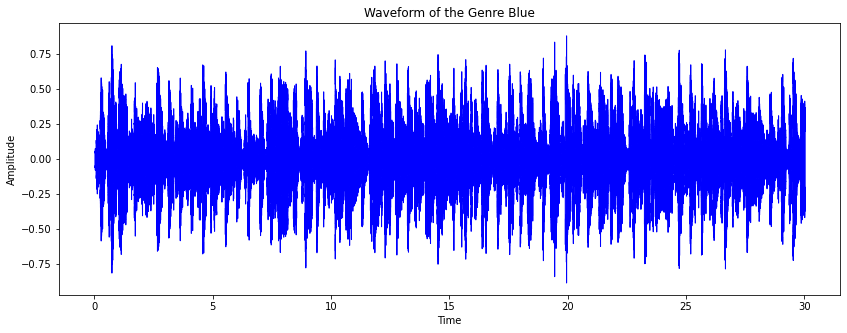

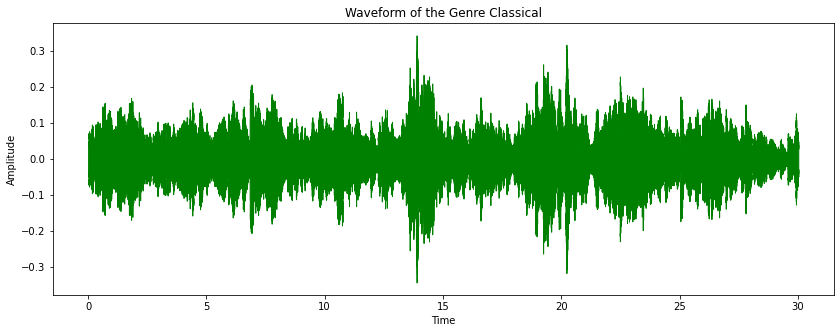

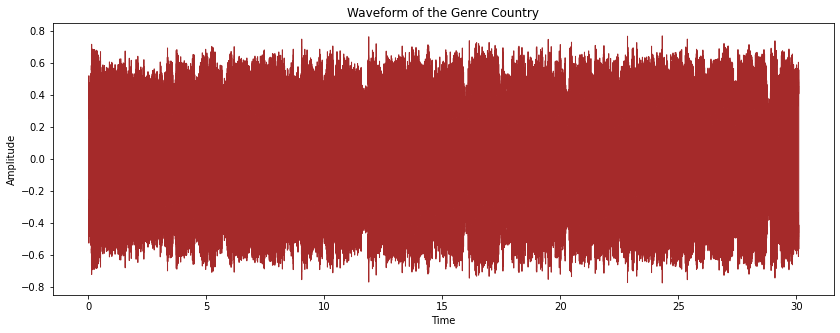

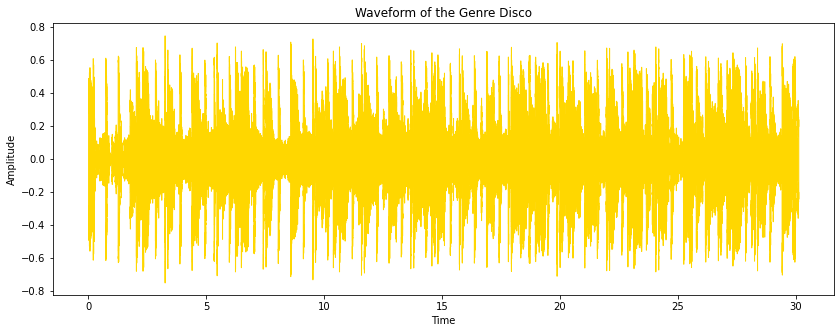

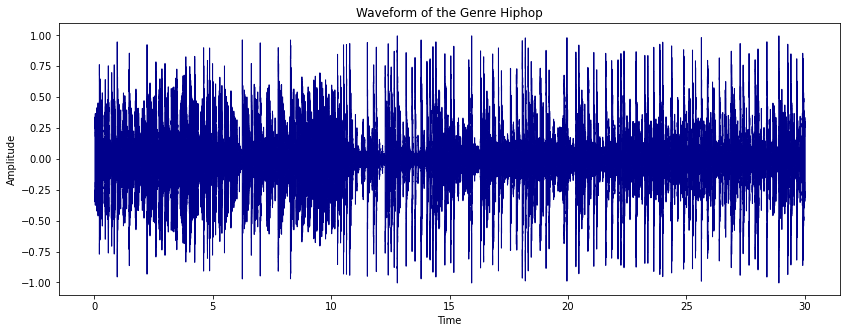

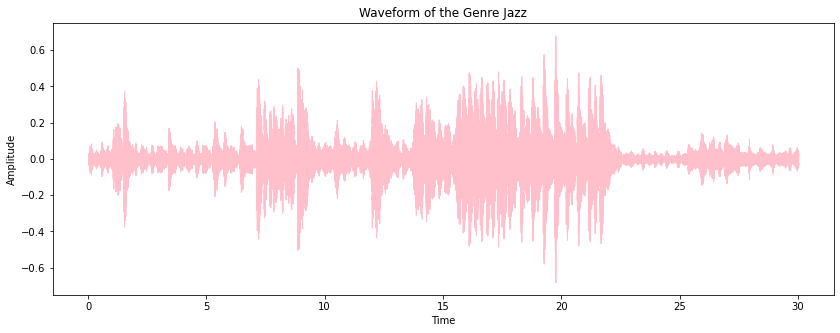

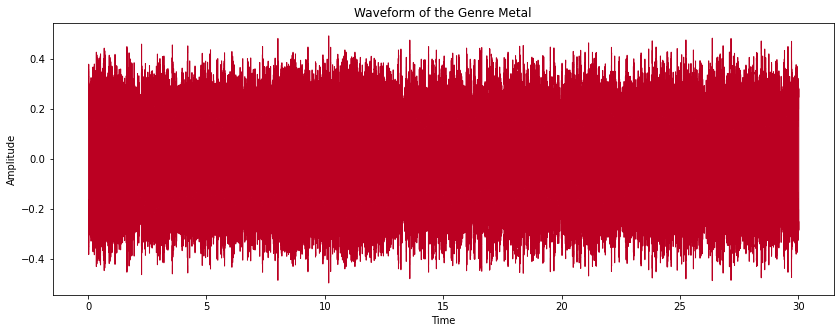

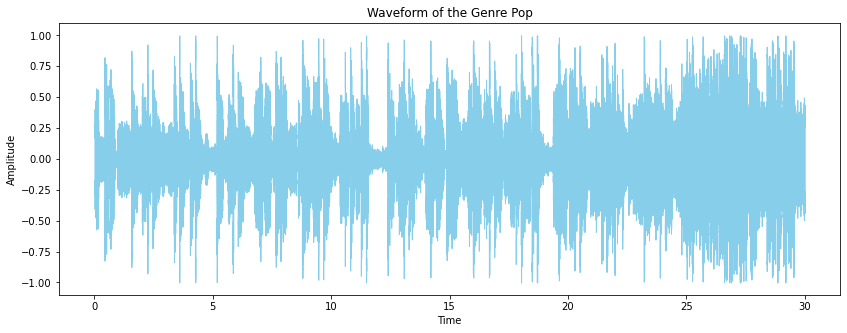

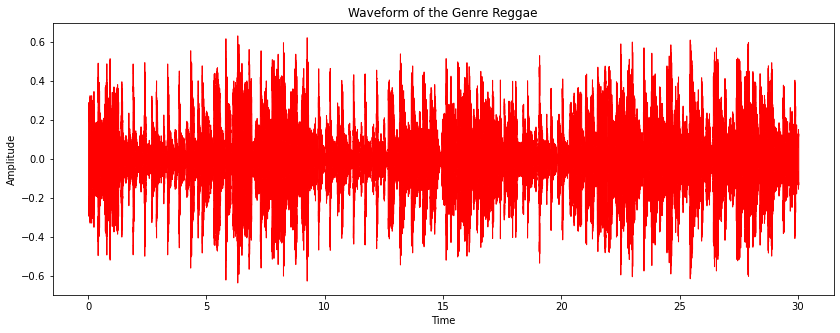

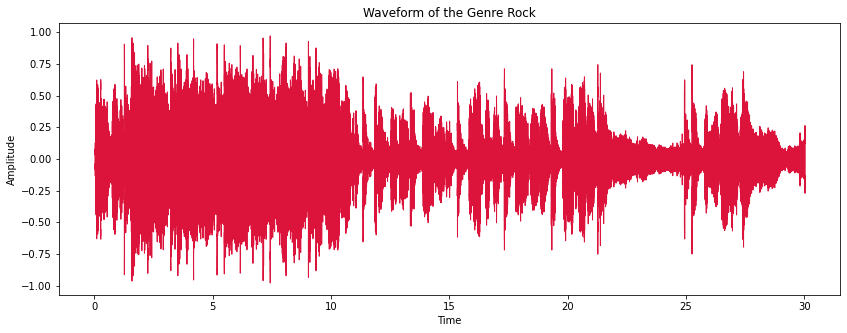

In [274]:
for i in range(0,len(data_music)) :
    plt.figure(figsize=(14, 5))
    librosa.display.waveshow(data_music[i], sr=sr, color=color[i])

    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.title(f'Waveform of the Genre {genre[i]}')
    plt.show()

Spectrogram

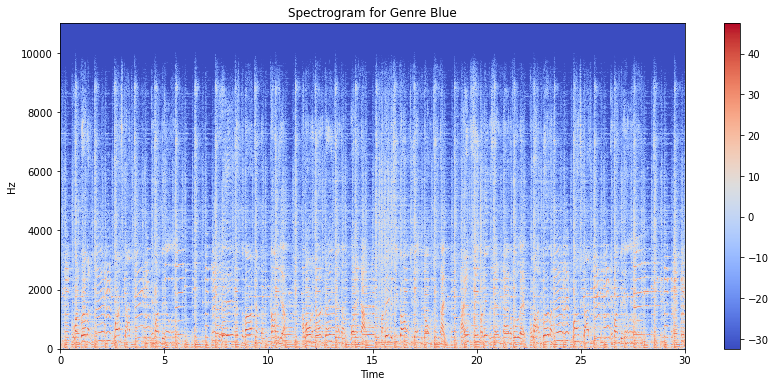

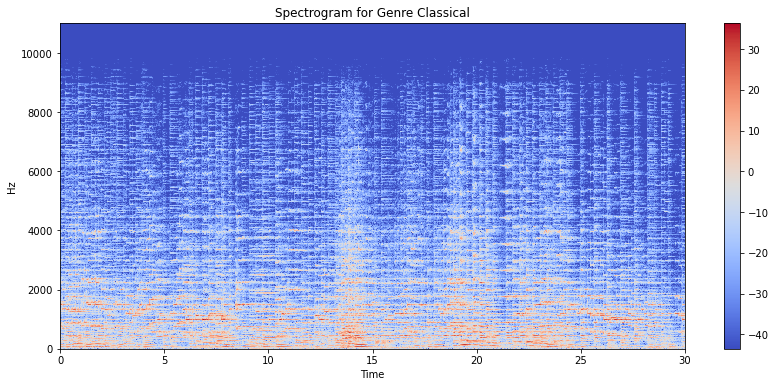

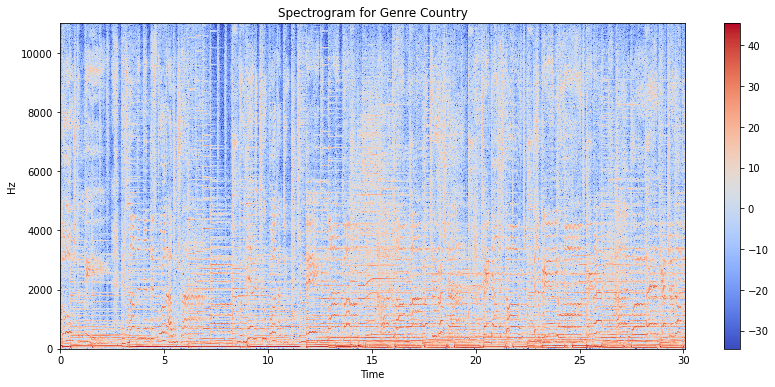

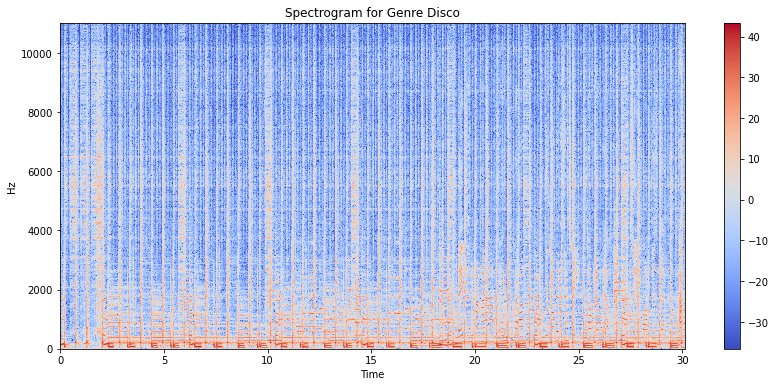

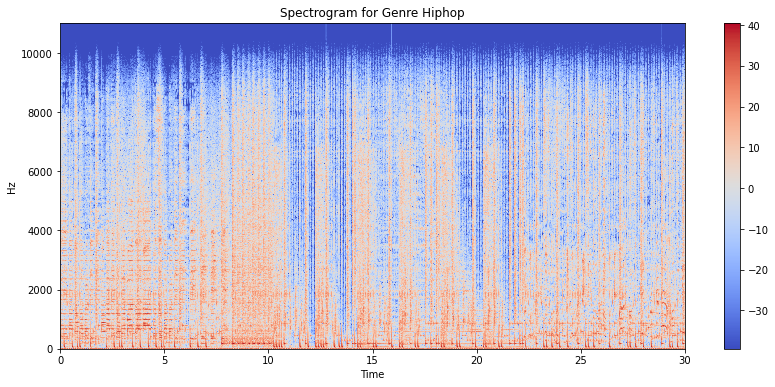

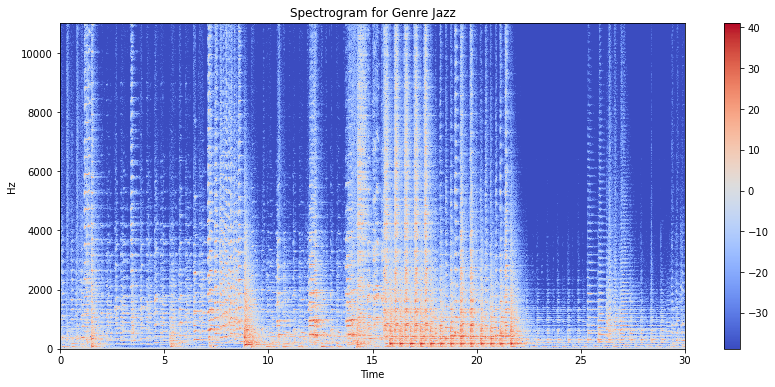

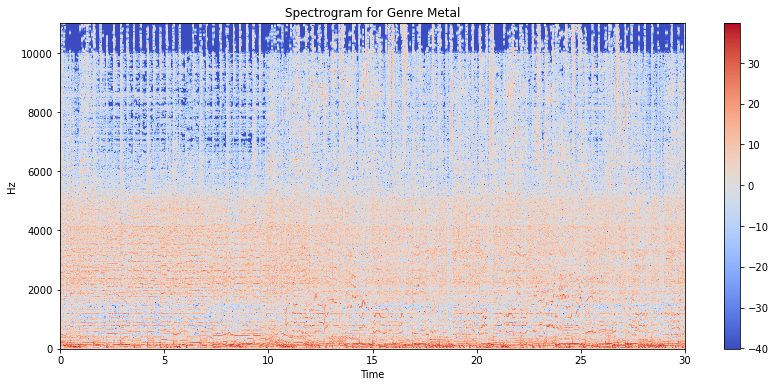

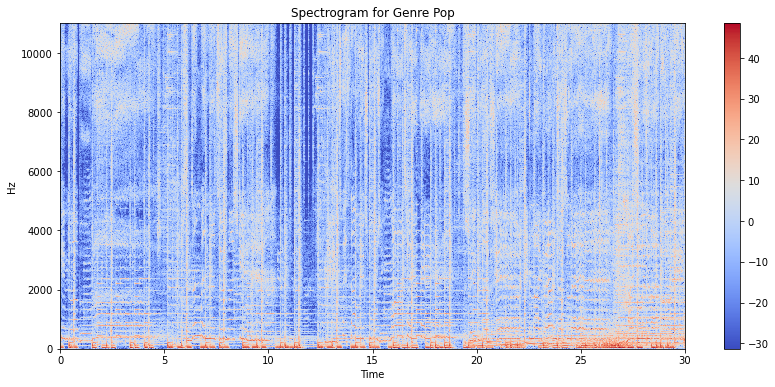

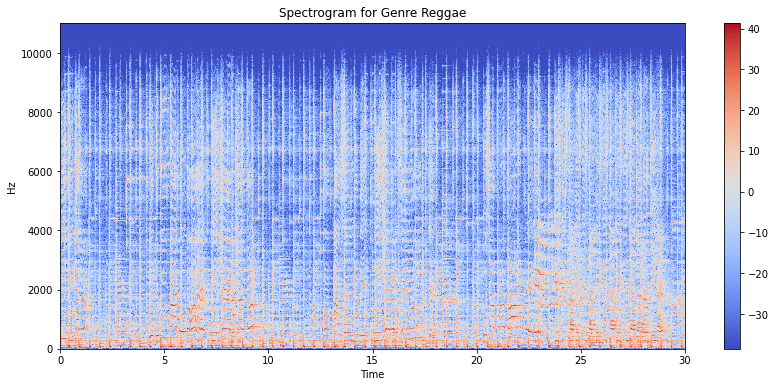

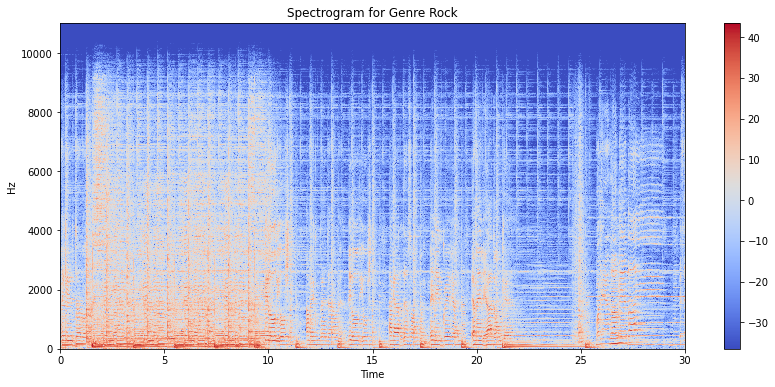

In [275]:
for i in range(0, len(data_music)) :
    stft = librosa.stft(data_music[i])
    stft_db = librosa.amplitude_to_db(abs(stft))
    plt.figure(figsize =(14, 6))
    librosa.display.specshow(stft_db, sr=sr, x_axis = 'time', y_axis = 'hz')
    plt.title(f'Spectrogram for Genre {genre[i]}')
    plt.colorbar()

Spectral Rolloff

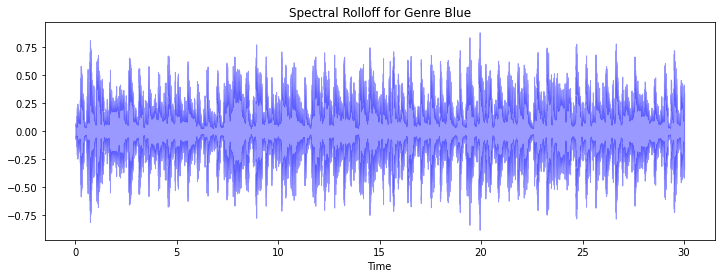

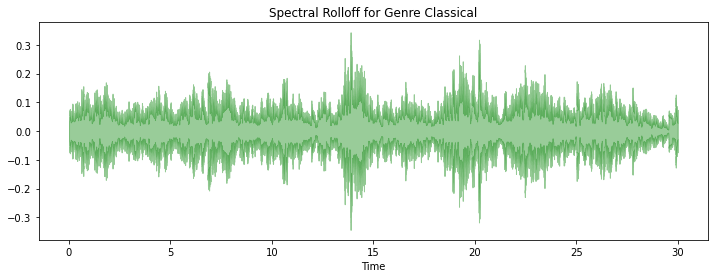

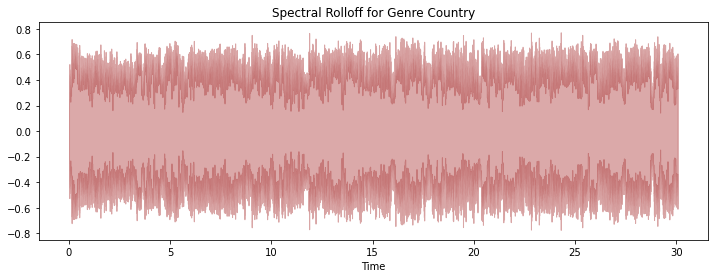

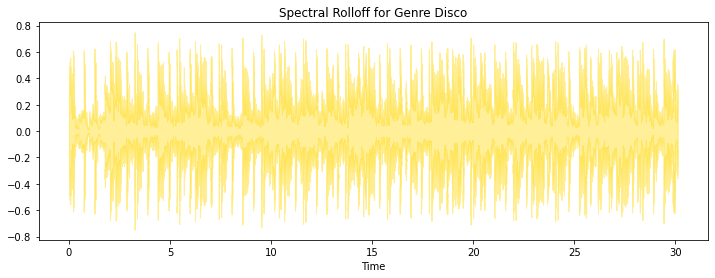

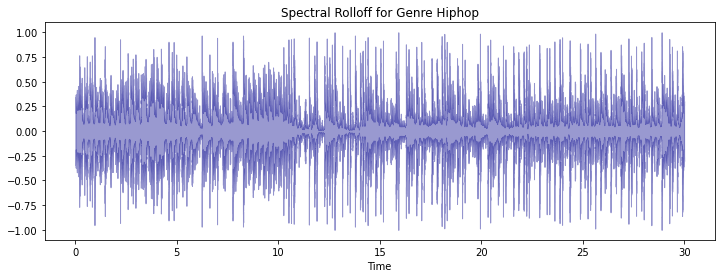

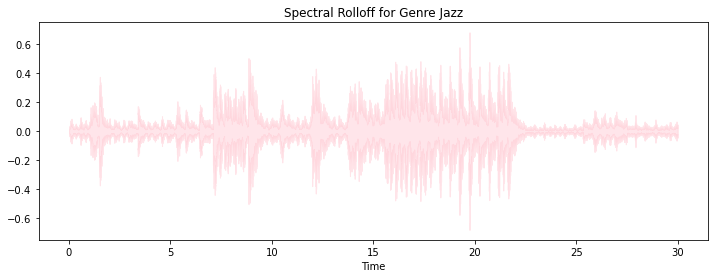

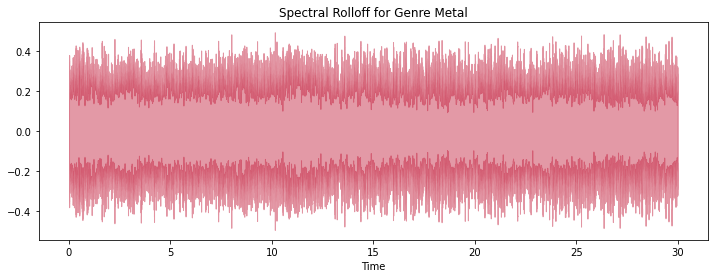

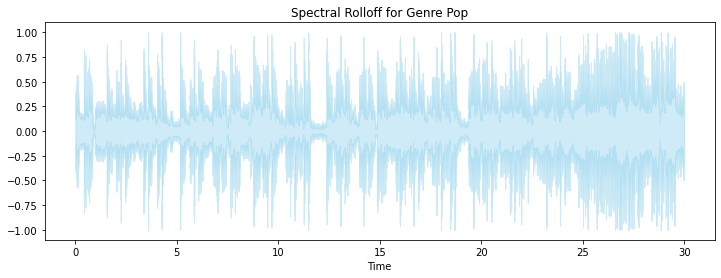

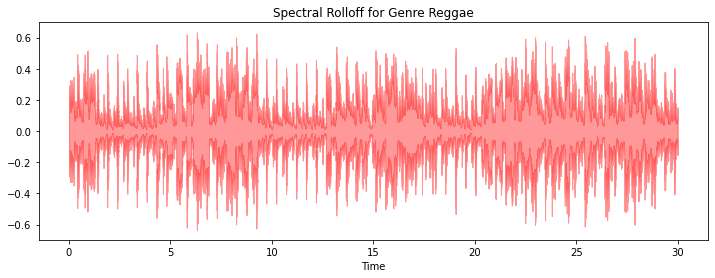

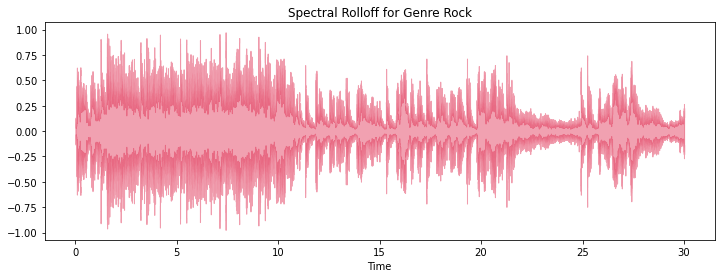

In [276]:
for i in range(0,len(data_music)) :
    spectral_rolloff = librosa.feature.spectral_rolloff(y = data_music[i], sr=sr)
    plt.figure(figsize = (12, 4))
    librosa.display.waveshow(data_music[i], sr=sr, alpha = 0.4, color=color[i])
    plt.title(f'Spectral Rolloff for Genre {genre[i]}')

Chroma Feature:

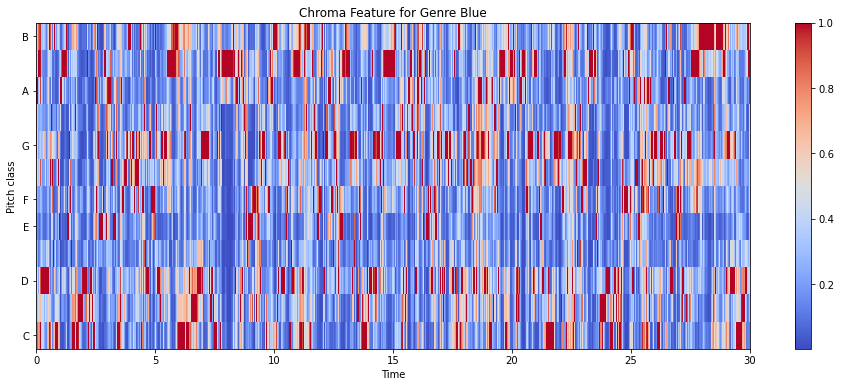

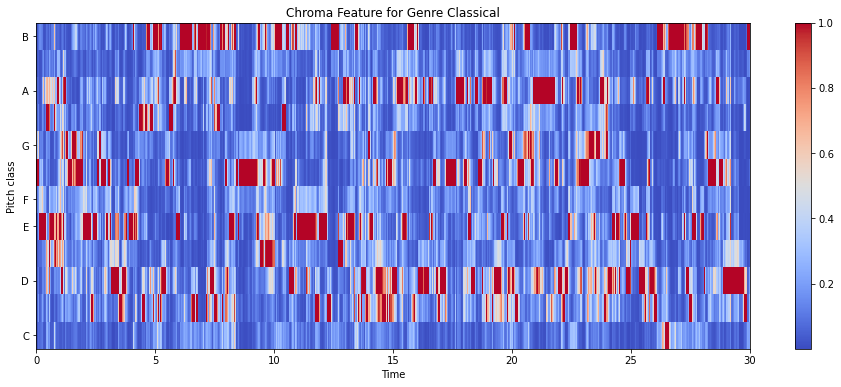

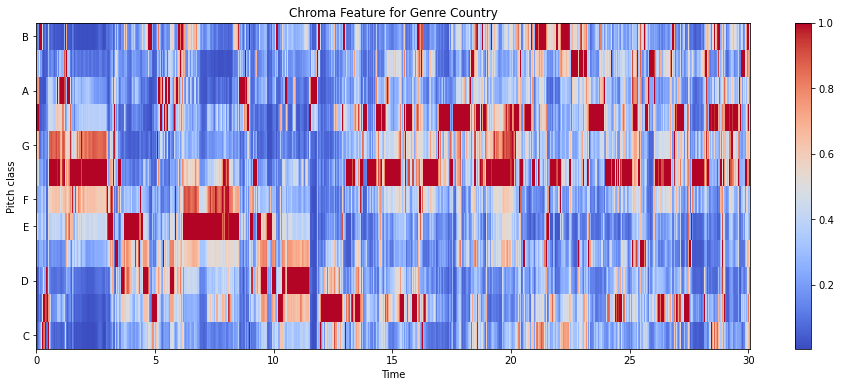

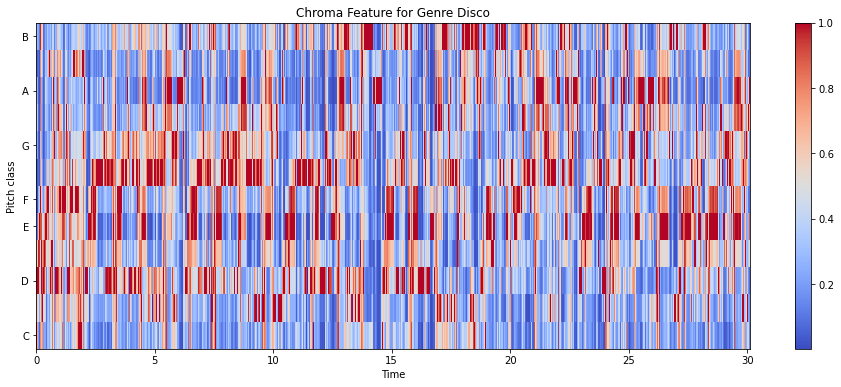

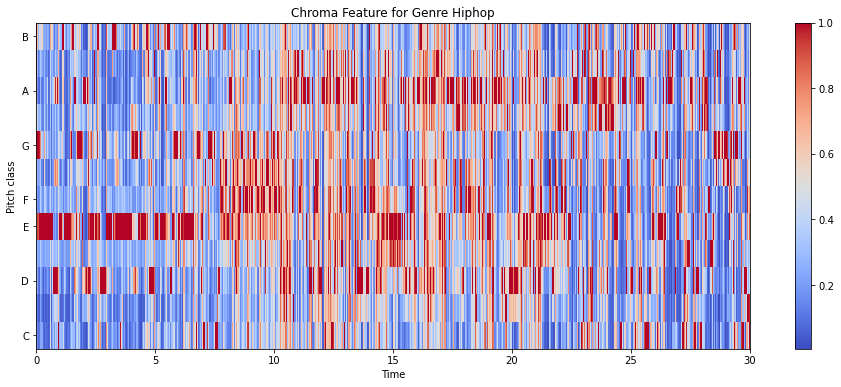

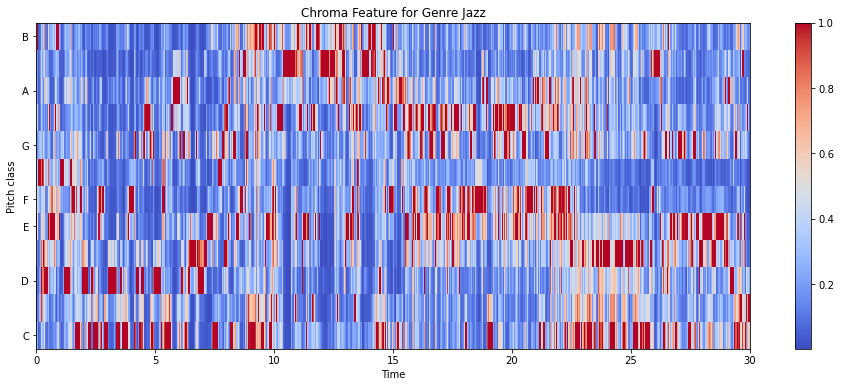

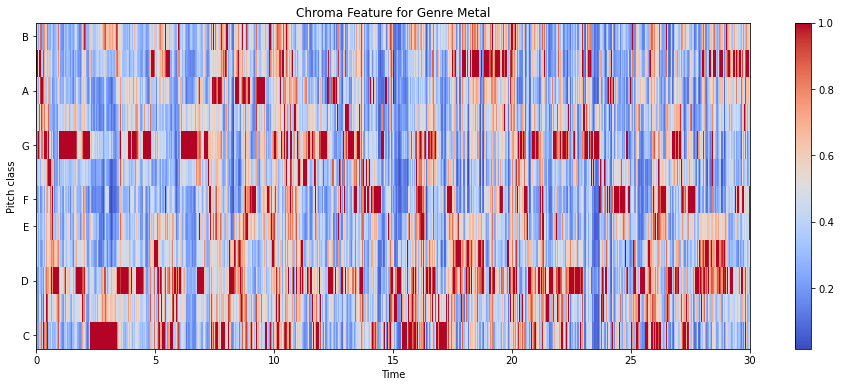

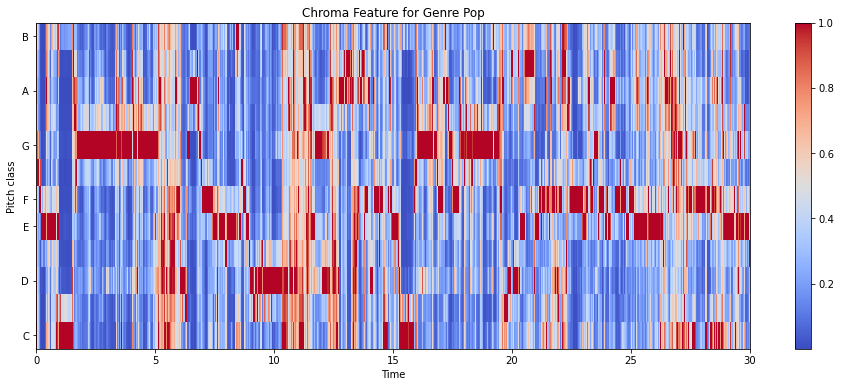

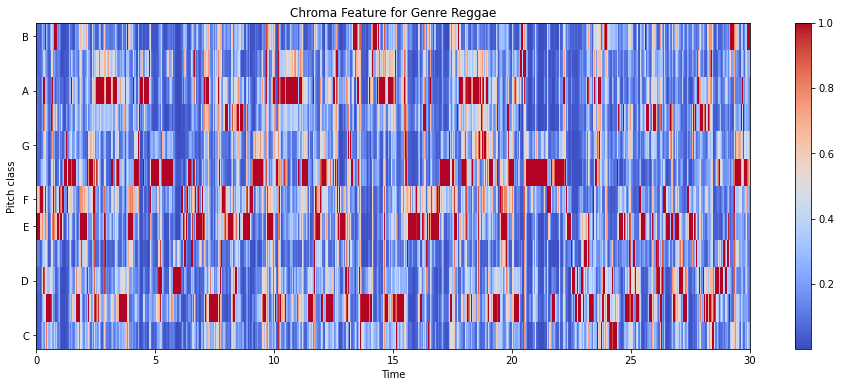

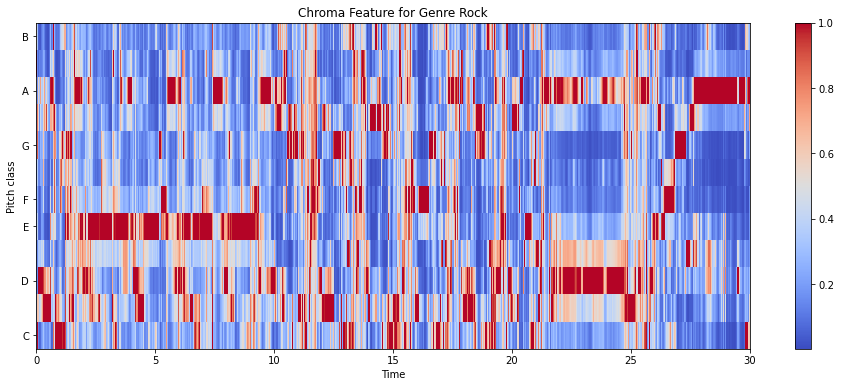

In [277]:
for i in range(0, len(data_music)) :
    chroma = librosa.feature.chroma_stft(y = data_music[i], sr = sr)
    plt.figure(figsize = (16,6))
    librosa.display.specshow(chroma, sr = sr, x_axis='time', y_axis='chroma', cmap='coolwarm')
    plt.colorbar()
    plt.title(f'Chroma Feature for Genre {genre[i]}')
    plt.show()

MFCC

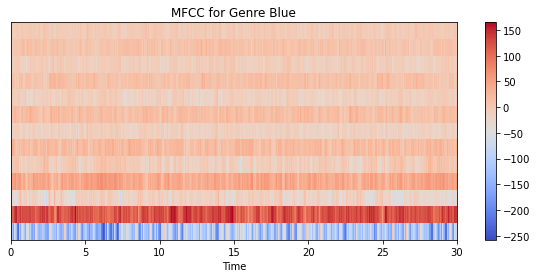

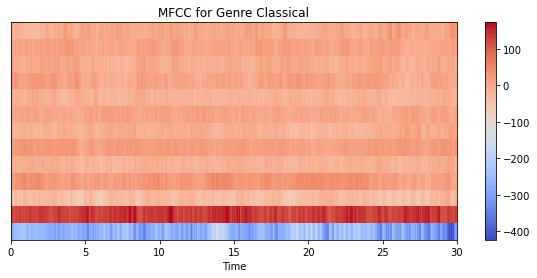

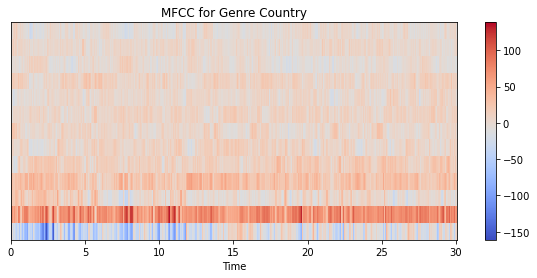

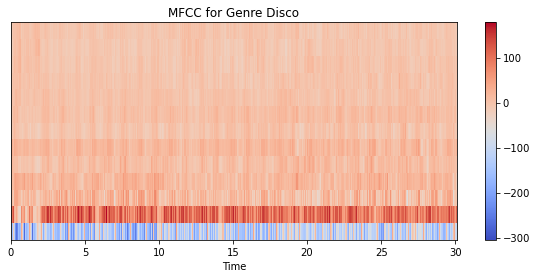

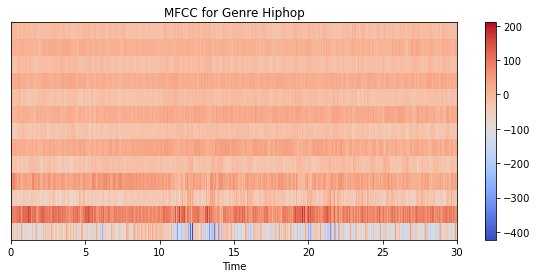

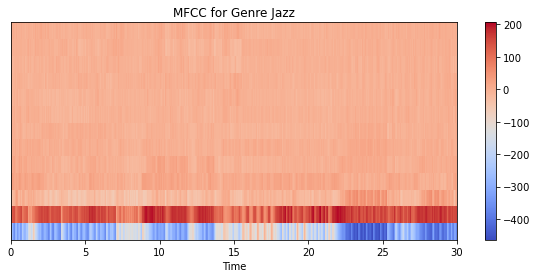

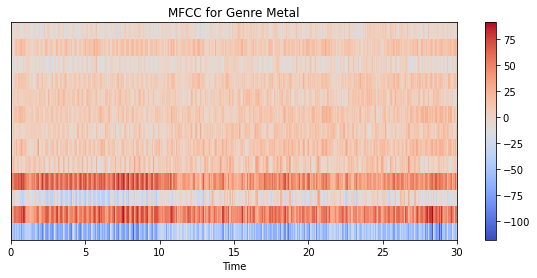

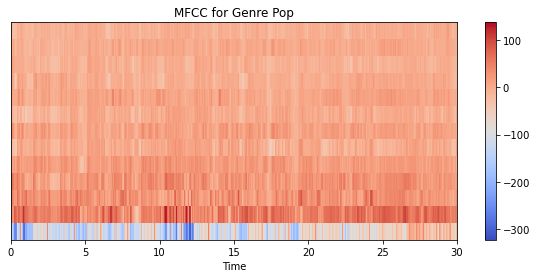

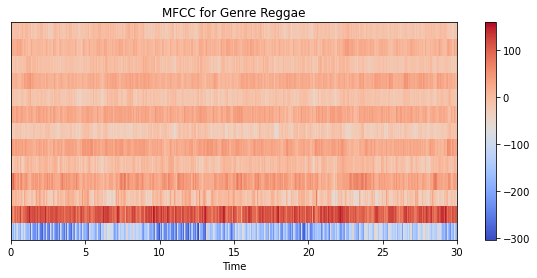

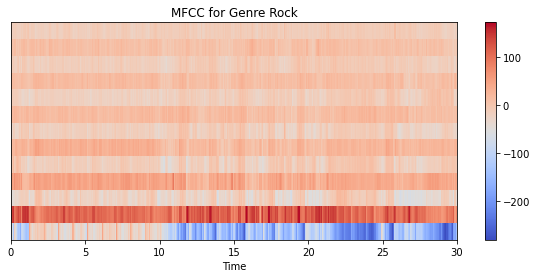

In [278]:
for i in range(0, len(data_music)) :
    mfccs = librosa.feature.mfcc(y=data_music[i], sr=sr, n_mfcc=13)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(mfccs, x_axis='time', sr=sr, cmap='coolwarm')
    plt.colorbar()
    plt.title(f'MFCC for Genre {genre[i]}')
    plt.show()

Zero Crossing Rate

The number of zero-crossing is :  21


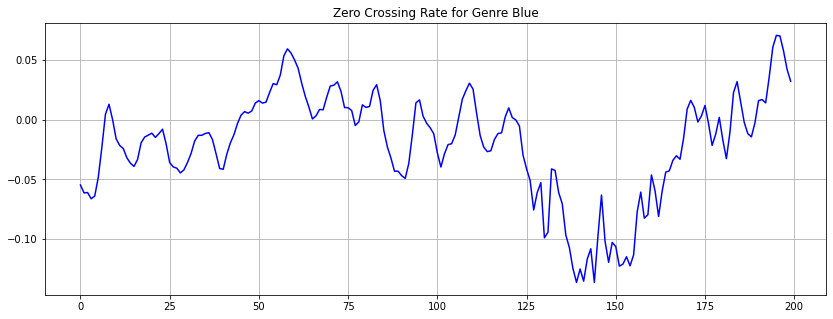

The number of zero-crossing is :  27


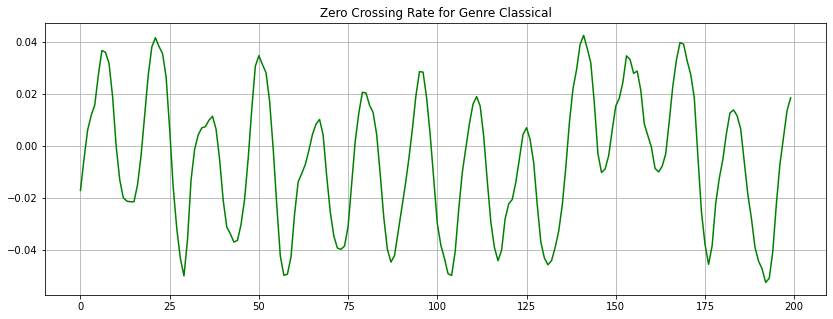

The number of zero-crossing is :  8


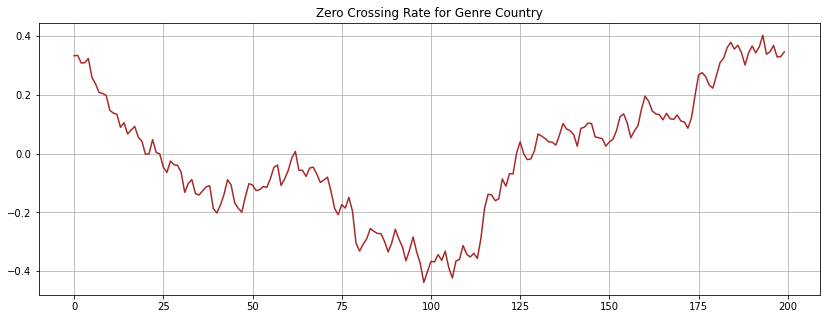

The number of zero-crossing is :  11


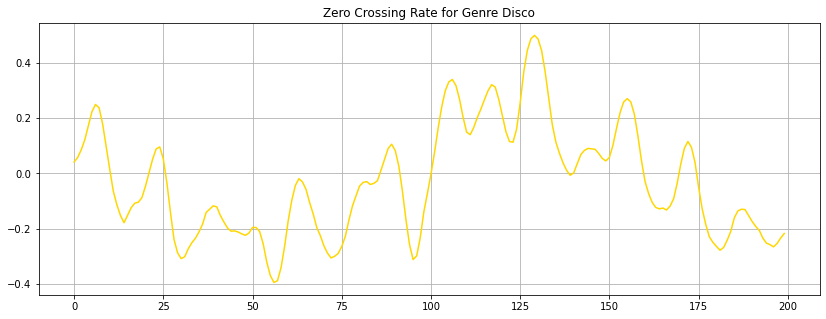

The number of zero-crossing is :  32


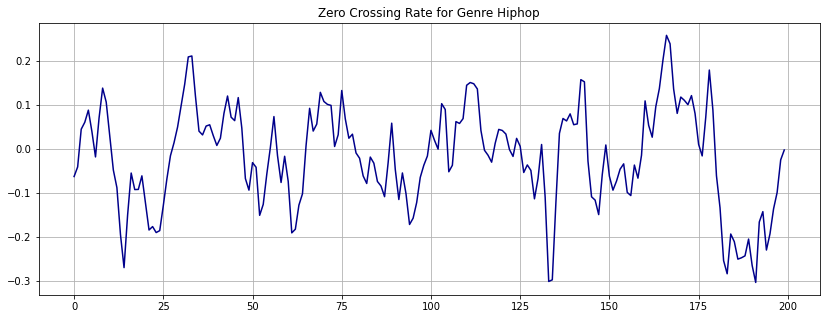

The number of zero-crossing is :  15


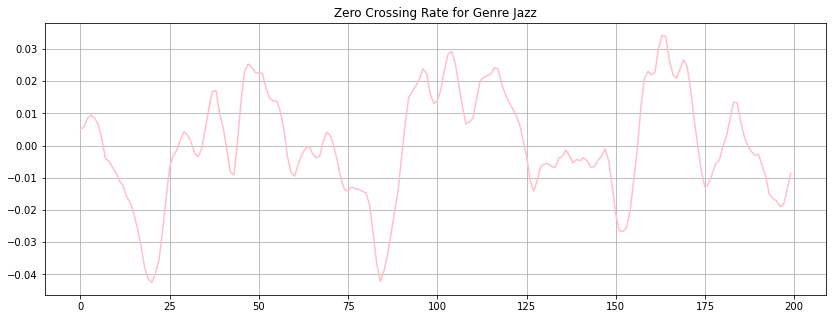

The number of zero-crossing is :  47


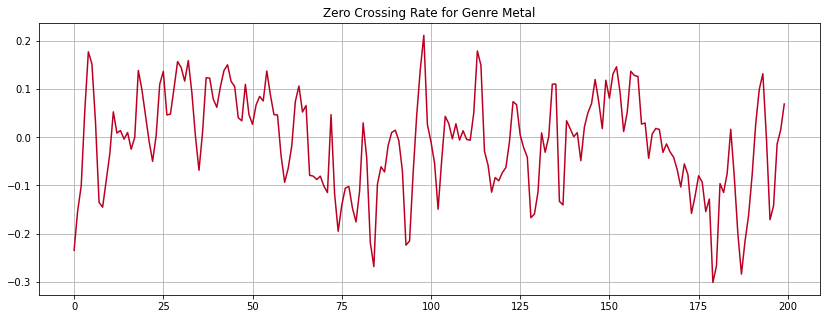

The number of zero-crossing is :  7


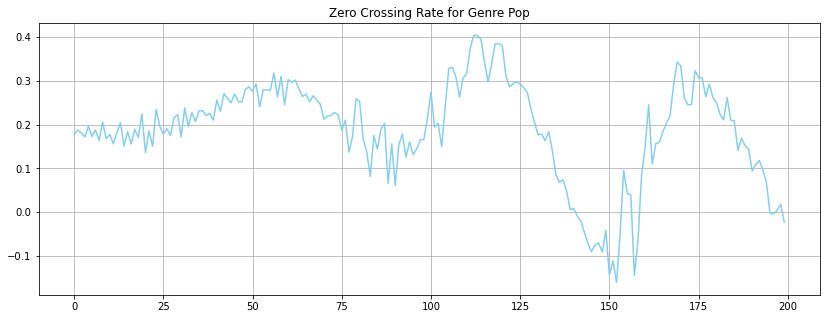

The number of zero-crossing is :  21


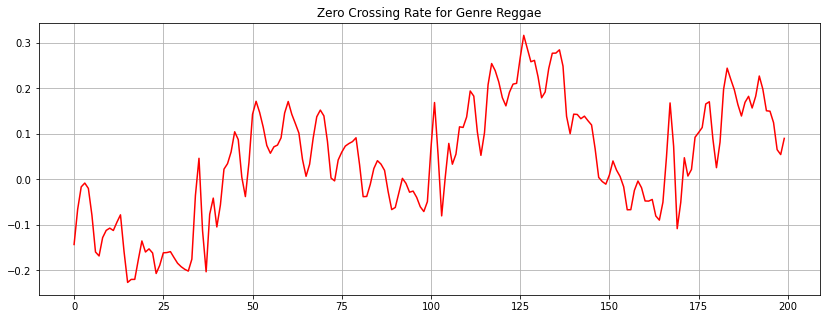

The number of zero-crossing is :  14


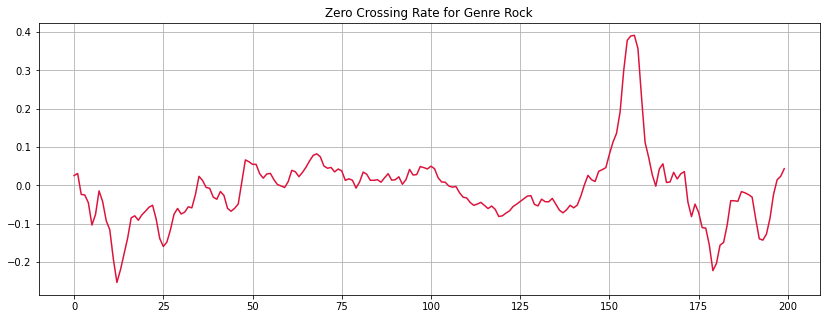

In [279]:
start = 1000
end = 1200
for i in range(0, len(data_music)) :
    plt.figure(figsize=(14,5))
    plt.plot(data_music[i][start:end], color=color[i])
    plt.title(f'Zero Crossing Rate for Genre {genre[i]}')
    plt.grid()

    zero_cross_rate = librosa.zero_crossings(data_music[i][start:end], pad=False)
    print("The number of zero-crossing is : ", sum(zero_cross_rate))
    plt.show()

Feature Engineering

In [280]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

In [281]:
# Transforming Features
class_list = music_data.iloc[:, -1]
convertor = LabelEncoder()
y = convertor.fit_transform(class_list)

In [282]:
y

array([0, 0, 0, ..., 9, 9, 9])

In [283]:
# Scaling of Features
fit = StandardScaler()
X = fit.fit_transform(np.array(music_data.iloc[:, :-1], dtype = float))

In [284]:
X

array([[ 0.        , -0.47823418,  0.64103381, ..., -0.51237921,
         0.12884682, -0.29173101],
       [ 0.        , -0.39367631,  0.13101707, ...,  1.00956355,
         1.27168611,  0.05527452],
       [ 0.        , -0.35228163,  0.76532861, ..., -0.04598171,
         0.65226613, -0.52061685],
       ...,
       [ 0.        , -0.3449272 ,  0.4299367 , ..., -0.15322724,
         0.11812995, -0.33861214],
       [ 0.        ,  0.09719913, -0.00748043, ..., -0.7229713 ,
         0.30307665, -0.95658885],
       [ 0.        , -0.10411463,  0.1947118 , ..., -0.37154794,
        -0.47214596, -0.55017821]])

In [285]:
from sklearn.model_selection import train_test_split

In [286]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25) # 0.25 x 0.8 = 0.2
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((5913, 58), (1972, 58), (5913,), (1972,))

In [287]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

In [288]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)
accuracy_knn = accuracy_score(y_test, y_pred_knn)

print(f'Accuracy: {accuracy_knn * 100:.2f}%')

Accuracy: 87.02%


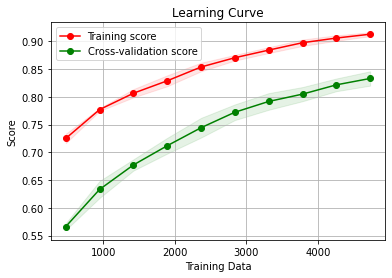

In [289]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(knn, X_train, y_train, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure()
plt.title("Learning Curve")
plt.xlabel("Training Data")
plt.ylabel("Score")

plt.grid()

plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

plt.legend(loc="best")
plt.show()

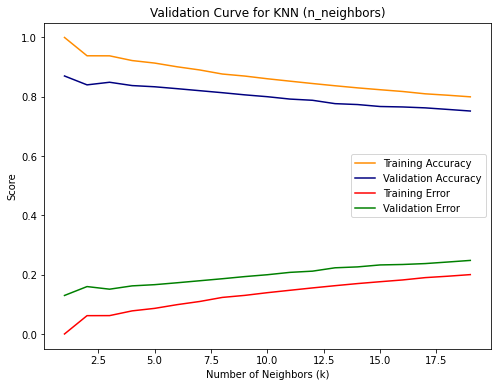

In [290]:
from sklearn.model_selection import validation_curve


param_range = np.arange(1, 20)
train_scores, test_scores = validation_curve(knn, X_train, y_train, param_name="n_neighbors", param_range=param_range, cv=5)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
train_error_mean = 1 - train_scores_mean
test_error_mean = 1 - test_scores_mean


plt.figure(figsize=(8, 6))
plt.title("Validation Curve for KNN (n_neighbors)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Score")
plt.plot(param_range, train_scores_mean, label="Training Accuracy", color="darkorange")
plt.plot(param_range, test_scores_mean, label="Validation Accuracy", color="navy")
plt.plot(param_range, train_error_mean, label="Training Error", color="red")
plt.plot(param_range, test_error_mean, label="Validation Error", color="green")
plt.legend()
plt.show()

LoR

In [291]:
lr_classifier = LogisticRegression(random_state=42,
                                   max_iter=5000,
                                   solver='liblinear',
                                   C = 0.01)

lr_classifier.fit(X_train, y_train)

y_pred_lr = lr_classifier.predict(X_test)

accuracy_lor = accuracy_score(y_test, y_pred_lr)

print(f'Accuracy: {accuracy_lor * 100:.2f}%')

Accuracy: 63.95%


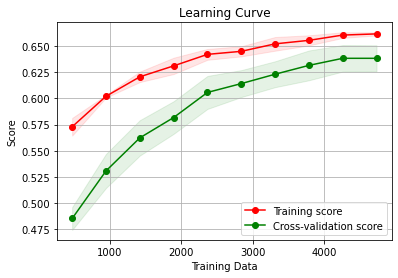

In [292]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(lr_classifier, X_train, y_train, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure()
plt.title("Learning Curve")
plt.xlabel("Training Data")
plt.ylabel("Score")

plt.grid()

plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

plt.legend(loc="best")
plt.show()

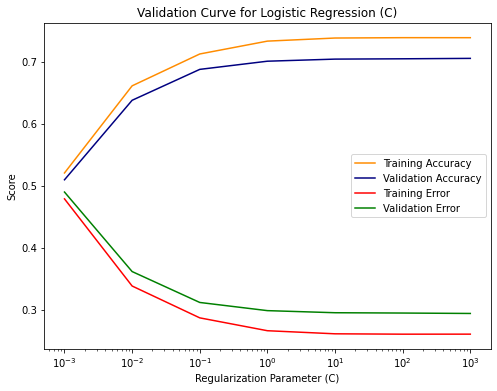

In [293]:
from sklearn.model_selection import validation_curve
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import numpy as np

param_range = np.logspace(-3, 3, 7)

train_scores, test_scores = validation_curve(
    lr_classifier, X_train, y_train, param_name="C", param_range=param_range, cv=5
)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
train_error_mean = 1 - train_scores_mean
test_error_mean = 1 - test_scores_mean

plt.figure(figsize=(8, 6))
plt.title("Validation Curve for Logistic Regression (C)")
plt.xlabel("Regularization Parameter (C)")
plt.ylabel("Score")
plt.semilogx(param_range, train_scores_mean, label="Training Accuracy", color="darkorange")
plt.semilogx(param_range, test_scores_mean, label="Validation Accuracy", color="navy")
plt.semilogx(param_range, train_error_mean, label="Training Error", color="red")
plt.semilogx(param_range, test_error_mean, label="Validation Error", color="green")
plt.legend()
plt.show()

Optimization and Validation:

Optimizing KNN

In [294]:
from sklearn.model_selection import validation_curve

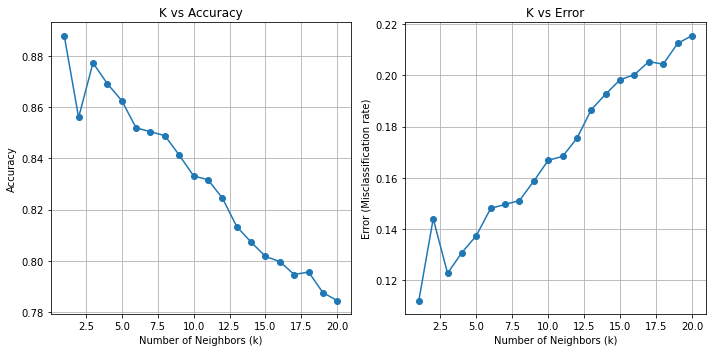

In [295]:
k_values = np.arange(1, 21)
accuracies = []
errors = []

# Iterate over different values of k
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)

    # Calculate accuracy
    accuracy = knn.score(X_val, y_val)
    accuracies.append(accuracy)

    # Calculate error (misclassification rate)
    error = 1 - accuracy
    errors.append(error)

# Plotting k vs accuracy
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(k_values, accuracies, marker='o', linestyle='-')
plt.title('K vs Accuracy')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Accuracy')
plt.grid(True)

# Plotting k vs error
plt.subplot(1, 2, 2)
plt.plot(k_values, errors, marker='o', linestyle='-')
plt.title('K vs Error')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Error (Misclassification rate)')
plt.grid(True)

plt.tight_layout()
plt.show()

In [296]:
from sklearn.model_selection import GridSearchCV

In [297]:
grid_params = { 'n_neighbors' : [3,5,7,9,11,13],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}

In [298]:
gs = GridSearchCV(knn, grid_params, verbose = 1, cv=3, n_jobs = -1)
g_res = gs.fit(X_train, y_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


In [299]:
g_res.best_params_

{'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}

In [300]:
knn = KNeighborsClassifier(metric = 'manhattan', n_neighbors = 3, weights = 'distance')

knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)

# Evaluate the classifier's performance
accuracy_knn = accuracy_score(y_test, y_pred_knn)

print(f'Accuracy: {accuracy_knn * 100:.2f}%')

Accuracy: 91.94%


In [301]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred_knn)

array([[180,   0,   4,   2,   2,   3,   0,   0,   4,   1],
       [  1, 177,   1,   0,   0,   3,   0,   1,   0,   1],
       [  3,   1, 185,   2,   0,   4,   0,   2,   7,  11],
       [  1,   1,   3, 171,   2,   0,   0,   2,   0,   8],
       [  1,   0,   1,   0, 199,   0,   1,   5,   5,   1],
       [  0,   9,   4,   0,   1, 178,   0,   0,   0,   0],
       [  0,   0,   0,   1,   1,   1, 185,   0,   0,   3],
       [  0,   1,   2,  10,   1,   2,   0, 176,   4,   0],
       [  0,   0,   0,   3,   2,   0,   0,   2, 197,   0],
       [  1,   1,   5,   9,   4,   2,   2,   1,   3, 165]], dtype=int64)

In [302]:
from sklearn.metrics import precision_score, recall_score, f1_score


In [303]:
precision_knn = precision_score(y_test, y_pred_knn, average='weighted')
recall_knn = recall_score(y_test, y_pred_knn, average='weighted')
f1_knn = f1_score(y_test, y_pred_knn, average='weighted')
print(f'k-NN Metrics:')
print(f'Precision: {precision_knn:.2f}')
print(f'Recall: {recall_knn:.2f}')
print(f'F1 Score: {f1_knn:.2f}')


k-NN Metrics:
Precision: 0.92
Recall: 0.92
F1 Score: 0.92


Optimizing LoR

In [304]:
lr_classifier = LogisticRegression(l1_ratio = None,warm_start = False, multi_class = 'multinomial', verbose = 0, random_state = 0,
                                   class_weight = None, intercept_scaling = 1.0, tol = 0.001, fit_intercept = True, C = 10.0,
                                   max_iter = 100, penalty = 'l2', solver = 'newton-cg')

lr_classifier.fit(X_train, y_train)

y_pred_lr = lr_classifier.predict(X_test)

accuracy_lor = accuracy_score(y_test, y_pred_lr)

print(f'Accuracy: {accuracy_lor * 100:.2f}%')

Accuracy: 71.35%


### For Unknown Samples

In [305]:
import numpy as np
import pandas as pd
import librosa
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [306]:
# Function to extract features from audio samples
def extract_features(audio_samples):
    # Use librosa to extract audio features
       # For simplicity, we're using a dummy feature (mean of spectral centroid) here
    spectral_centroid = librosa.feature.spectral_centroid(y=audio_samples)[0]
    mean_spectral_centroid = np.mean(spectral_centroid)
    return mean_spectral_centroid

In [307]:
# Load Known Samples
file_path = "C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data"
genres = os.listdir(f'{file_path}/genres_original/')
data_music = [None] * len(genres)


In [308]:
for i, genre in enumerate(genres):
    audio_file_path = f'{file_path}/genres_original/{genre}/{genre}.00000.wav'
    data_music[i], sr = librosa.load(audio_file_path)

In [309]:
# Extract Features for Known Samples
known_features = [extract_features(sample) for sample in data_music]


In [310]:

# Labels for Known Samples
labels = [genre for genre in genres]

In [311]:

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)

In [312]:

# Features for Known Samples
X = np.array(known_features).reshape(len(known_features), 1)

In [313]:
# Scaling of Features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [314]:
# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42)

# Model Training
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
# Model Evaluation
y_pred_test = knn.predict(X_test)


In [315]:
# Unknown Samples Classification (Assuming you already have an 'unknown_sample' loaded)
unknown_sample, sr = librosa.load('C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Unkown_samples/song6.wav')
unknown_feature = extract_features(unknown_sample)
unknown_feature_scaled = scaler.transform(np.array([unknown_feature]).reshape(1, -1))


In [316]:
# Predict the genre for the unknown sample
y_pred_unknown = knn.predict(unknown_feature_scaled)
predicted_genre = label_encoder.inverse_transform(y_pred_unknown)[0]
print(f'Predicted Genre for Unknown Sample: {predicted_genre}')

Predicted Genre for Unknown Sample: blues


## For Known Samples

In [317]:
# Function to extract features from audio samples
def extract_features(audio_samples):
    # Use librosa to extract audio features
    # Replace this with your own feature extraction logic
    # For simplicity, we're using a dummy feature (mean of spectral centroid) here
    spectral_centroid = librosa.feature.spectral_centroid(y=audio_samples)[0]
    mean_spectral_centroid = np.mean(spectral_centroid)
    return mean_spectral_centroid

In [318]:
# Load Known Samples
file_path = "C:/Users/Eswar/Documents/sem5/PR/music genre/archive/Data"
genres = os.listdir(f'{file_path}/genres_original/')
data_music = [None] * len(genres)

for i, genre in enumerate(genres):
    audio_file_path = f'{file_path}/genres_original/{genre}/{genre}.00000.wav'
    data_music[i], sr = librosa.load(audio_file_path)

In [319]:
# Extract Features for Known Samples
known_features = [extract_features(sample) for sample in data_music]

# Labels for Known Samples
labels = [genre for genre in genres]

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)

In [320]:
# Features for Known Samples
X = np.array(known_features).reshape(len(known_features), 1)

# Scaling of Features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [321]:

# Train k-NN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_scaled, y_encoded)


KNeighborsClassifier()

In [322]:
# Generate predictions for known samples
known_predictions = knn.predict(X_scaled)

# Decode labels back to original genre names
predicted_genres = label_encoder.inverse_transform(known_predictions)

In [323]:

# Display the predicted genres for each known sample
for i, genre in enumerate(predicted_genres):
    print(f"Sample {i + 1}: Predicted Genre - {genre}")

Sample 1: Predicted Genre - blues
Sample 2: Predicted Genre - blues
Sample 3: Predicted Genre - country
Sample 4: Predicted Genre - country
Sample 5: Predicted Genre - country
Sample 6: Predicted Genre - blues
Sample 7: Predicted Genre - country
Sample 8: Predicted Genre - country
Sample 9: Predicted Genre - blues
Sample 10: Predicted Genre - blues
